In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import skimage.morphology as mo
from skimage import io, color #Scikit-Image
from PIL import Image # Pillow
import cv2
import os
import random
import shutil
import torch # Will work on using PyTorch here later
from torch.utils.data  import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt
import pandas as pd
# from muscle_split import Muscle 

In [6]:
def convert_images_to_binary_bw(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Iterate over all files in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(".jpeg") or filename.endswith(".jpg"):
            input_file_path = os.path.join(input_folder, filename)
            output_file_path = os.path.join(output_folder, filename)
            
            # Open an image file
            with Image.open(input_file_path) as img:
                # Convert the image to grayscale
                gray_img = img.convert("L")
                
                # Save the binary image to the output folder
                gray_img.save(output_file_path)

# Example usage
input_folder = "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/ABS"
output_folder = "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw"
convert_images_to_binary_bw(input_folder, output_folder)

In [7]:
# split clinical data UMN into 3 body parts 
def split_files_by_keyword(source_folder, UM_quad, UM_biceps, UM_abs):
    # Create destination folders if they don't exist
    os.makedirs(UM_quad, exist_ok=True)
    os.makedirs(UM_biceps, exist_ok=True)
    os.makedirs(UM_abs, exist_ok=True)

    # Iterate over all files in the source folder
    for filename in os.listdir(source_folder):
        if filename.endswith(".jpg"):
            # Construct full file path
            file_path = os.path.join(source_folder, filename)
            
            if "QUAD" in filename.upper() or "Q" in filename.upper() :
                shutil.move(file_path, os.path.join(UM_quad, filename))
            elif "AB" in filename.upper() or "A" in filename.upper(): 
                shutil.move(file_path, os.path.join(UM_abs, filename))
            else:
                shutil.move(file_path, os.path.join(UM_biceps, filename))

source_folder = '/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/UM_masked'
UM_quad = '/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data//QUAD'
UM_biceps = '/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data//BICEPS'
UM_abs = '/Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/ABS'

# Call the function
split_files_by_keyword(source_folder, UM_quad, UM_biceps, UM_abs)

In [24]:
from muscle_split import Muscle

# 1) Define transforms for X (input image) and Y (mask)
tx_X = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # mean=0.5, std=0.5
])

tx_Y = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x > 0.5).float())  # Convert to binary mask
])

# 2) Instantiate the Muscle dataset for each split
#    For example, each time we create a Muscle dataset,
#    we specify 'split', 'transformX', 'transformY', and 
#    the fractions for validation/test sets. 
#    Here, we choose to hold out 20% for validation and 20% for test (total 40%).
train_data = Muscle(
    split='train', 
    transformX=tx_X, 
    transformY=tx_Y, 
    validation_set_size=0.2,  # 20% 
    test_set_size=0.2         # 20%
)

validation_data = Muscle(
    split='validation', 
    transformX=tx_X, 
    transformY=tx_Y,
    validation_set_size=0.2,  # Must match the original split
    test_set_size=0.2         # Must match the original split
)

test_data = Muscle(
    split='test', 
    transformX=tx_X, 
    transformY=tx_Y,
    validation_set_size=0.2, 
    test_set_size=0.2
)

# 3) Wrap each dataset in a DataLoader for batching
from torch.utils.data import DataLoader

train_loader = DataLoader(train_data, batch_size=8, shuffle=True, num_workers=2)
validation_loader = DataLoader(validation_data, batch_size=8, shuffle=False, num_workers=2)
test_loader = DataLoader(test_data, batch_size=8, shuffle=False, num_workers=2)

print("Number of training batches:", len(train_loader))
print("Number of validation batches:", len(validation_loader))
print("Number of test batches:", len(test_loader))

Total data size in CSV: 670
Train size: 402 | Validation size: 134 | Test size: 134
Current split: train -> 402 samples selected.
Total data size in CSV: 670
Train size: 402 | Validation size: 134 | Test size: 134
Current split: validation -> 134 samples selected.
Total data size in CSV: 670
Train size: 402 | Validation size: 134 | Test size: 134
Current split: test -> 134 samples selected.
Number of training batches: 51
Number of validation batches: 17
Number of test batches: 17


In [9]:
batch_size=8
train_loader = DataLoader(dataset=train_data, batch_size=8, shuffle=True, num_workers=2)
validation_loader = DataLoader(dataset=validation_data, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(dataset=test_data, batch_size=8, shuffle=True, num_workers=2)

print(len(train_loader)) 
print(len(validation_loader)) 
print(len(test_loader))

51
17
17


In [10]:
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
def im_converterX(tensor):
    image = tensor.to(device).cpu().clone().detach().numpy() # move tensor to MPS, then to CPU and convert to numpy
    image = image.transpose(1, 2, 0) # swapping axes making (1, 28, 28) image to a (28, 28, 1)
    print("image shape is ", image.shape)
    image = image * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5)) # unnormalizing the image
    image = image.clip(0, 1) # to make sure final values are in range 0 to 1 as .ToTensor outputted
    return image

def im_converterY(tensor):
    image = tensor.to(device).cpu().clone().detach().numpy() # move tensor to MPS, then to CPU and convert to numpy
    image = image.transpose(1, 2, 0)
    print("image shape is ", image.shape)
    image = image * np.array((1, 1, 1))
    image = image.clip(0, 1)
    return image

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_50102518_BICEP2_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_50102518_BICEP2_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_33072318_BICEP4_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_33072318_BICEP4_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_46092018_BICEP3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_46092018_BICEP3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_55022619_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_55022619_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_36082218_QUAD2_R.jpg, Mask: /Users/taliacho/Downl

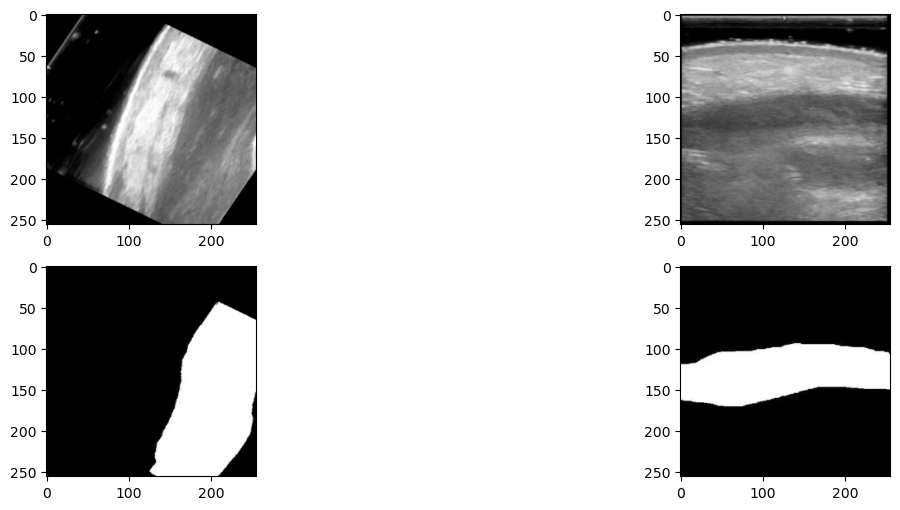

In [11]:
fig = plt.figure(figsize = (15,6))
for ith_batch, sample_batched in enumerate(train_loader):
    print(ith_batch, sample_batched['image'].size(), sample_batched['mask'].size())
    for index in range(2):
        ax = fig.add_subplot(2, 2 , index + 1)  # subplot index starts from 1
        plt.imshow(im_converterX(sample_batched['image'][index]))
        ax = fig.add_subplot(2, 2, index + 3)
        plt.imshow(im_converterY(sample_batched['mask'][index]))
    break

In [12]:
class double_conv(nn.Module):
  '''(conv => BN => ReLU) * 2'''
  def __init__(self, in_ch, out_ch):
    super(double_conv, self).__init__()
    self.conv = nn.Sequential(
      nn.Conv2d(in_ch, out_ch, 3, padding=1),
      nn.BatchNorm2d(out_ch),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_ch, out_ch, 3, padding=1),
      nn.BatchNorm2d(out_ch),
      nn.ReLU(inplace=True)
    )

  def forward(self, x):
    x = self.conv(x)
    return x

class inconv(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(inconv, self).__init__()
    self.conv = double_conv(in_ch, out_ch)

  def forward(self, x):
    x = self.conv(x)
    return x

class down(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(down, self).__init__()
    self.mpconv = nn.Sequential(
        nn.MaxPool2d(2),
        double_conv(in_ch, out_ch)
    )

  def forward(self, x):
    x = self.mpconv(x)
    return x

class up(nn.Module):
  def __init__(self, in_ch, out_ch, bilinear=True):
    super(up, self).__init__()
    self.up = nn.Upsample(
      scale_factor=2, mode='bilinear', align_corners=True)
    self.up = nn.ConvTranspose2d(in_ch // 2, in_ch // 2, kernel_size=2, stride=2)
    self.conv = double_conv(in_ch, out_ch)

  def forward(self, x1, x2):
    x1 = self.up(x1)
    diff1 = x2.shape[2]-x1.shape[2]
    diff2 = x2.shape[3]-x1.shape[3]
    x1 = F.pad(x1, pad=(diff1//2, diff1-diff1//2, diff2//2, diff2-diff2//2))
    x = torch.cat([x2, x1], dim=1)
    x = self.conv(x)
    return x

class outconv(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(outconv, self).__init__()
    self.conv = nn.Conv2d(in_ch, out_ch, 1)

  def forward(self, x):
    x = self.conv(x)
    return x

In [13]:
class UNet(nn.Module):
  def __init__(self, n_channels, n_classes):
    super(UNet, self).__init__()
    self.inc = inconv(n_channels, 64)
    self.down1 = down(64, 128)
    self.down2 = down(128, 256)
    self.down3 = down(256, 512)
    self.down4 = down(512, 512)
    self.up1 = up(1024, 256, bilinear = False)
    self.up2 = up(512, 128, bilinear = False)
    self.up3 = up(256, 64, bilinear = False)
    self.up4 = up(128, 64, bilinear = False)
    self.outc = outconv(64, n_classes)
    self.dropout = torch.nn.Dropout2d(0.5)

  def forward(self, x):
    x = x.float()
    x1 = self.inc(x)
    x2 = self.down1(x1)
    x3 = self.down2(x2)
    x4 = self.down3(x3)
    x5 = self.down4(x4)
    x = self.up1(x5, x4)
    x = self.up2(x, x3)
    x = self.dropout(x)
    x = self.up3(x, x2)
    x = self.up4(x, x1)
    x = self.outc(x)
    return torch.sigmoid(x)

In [14]:
model = UNet(1, 1)
model.to(device)
print(f"Model Loaded to {device}")

Model Loaded to mps


In [15]:
criterion = nn.BCELoss() # BCE = Binary Cross Entropy
optimizer = torch.optim.Adam(model.parameters(), lr = 0.01) # lr = learning rate

In [16]:
# calculates similarity index between predicted and actual segmentation
def dice_index(y_pred, y_actual):
  smooth = 0.000001 # prevent division by 0
  size_of_batch = y_pred.size(0)
  p1 = y_pred.view(size_of_batch, -1)
  p2 = y_actual.view(size_of_batch, -1)
  intersection = (p1 * p2).sum()
  dice =  ((2.0 * intersection )+ smooth) / (p1.sum() + p2.sum() + smooth)
  return dice

# calculate dice loss which will be later used in loss function calculation
def dice_loss(y_predict, y_train): ## to add in bce looss
  return 1 -(dice_index(y_predict, y_train))

In [17]:
epochs = 40  # number of iterations of the training dataset during the training process

train_running_loss_history = []
validation_running_loss_history = []

# Check if MPS is available and set the device
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")

model.to(device)

for e in range(epochs):
    train_running_loss = 0.0
    validation_running_loss = 0.0
    model.train()
    for ith_batch, sample_batched in enumerate(train_loader):
        X_train = sample_batched['image'].to(device)
        y_train = sample_batched['mask'].to(device)  # hayo: make the weight to device
        optimizer.zero_grad()
        y_pred = model(X_train)  # hayo: Input type and weight type should be the same
        loss = 0.30 * dice_loss(y_pred, y_train) + 0.70 * criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()
        if ith_batch % 5 == 0:
            print('Epoch: ', e + 1, 'Batch: ', ith_batch, 'Current Loss: ', loss.item())
        train_running_loss += loss.item()
    else:
        with torch.no_grad():
            model.eval()
            for ith_batch, sample_batched in enumerate(validation_loader):
                X_val = sample_batched['image'].to(device)
                y_val = sample_batched['mask'].to(device)
                y_out = model(X_val)
                out_val = (y_out + 0.5).int().float()
                val_loss = 0.3 * dice_loss(out_val, y_val) + 0.7 * criterion(y_out, y_val)
                validation_running_loss += val_loss.item()
            print("================================================================================")
            print("Epoch {} completed".format(e + 1))

            train_epoch_loss = train_running_loss / len(train_loader)
            validation_epoch_loss = validation_running_loss / len(validation_loader)

            print("Average train loss is {}: ".format(train_epoch_loss))
            print("Average validation loss is {}".format(validation_epoch_loss))
            print("================================================================================")
            train_running_loss_history.append(train_epoch_loss)
            validation_running_loss_history.append(validation_epoch_loss)

    torch.mps.empty_cache() if device.type == 'mps' else torch.cuda.empty_cache()

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_27062218_QUAD1_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_27062218_QUAD1_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_08021218_BICEP2_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_08021218_BICEP2_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_28062718_QUAD1_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_28062718_QUAD1_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/47092018_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/47092018_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_04120117_QUAD1_R.jpg, Mask: /Users/taliacho/Downloads/Ran

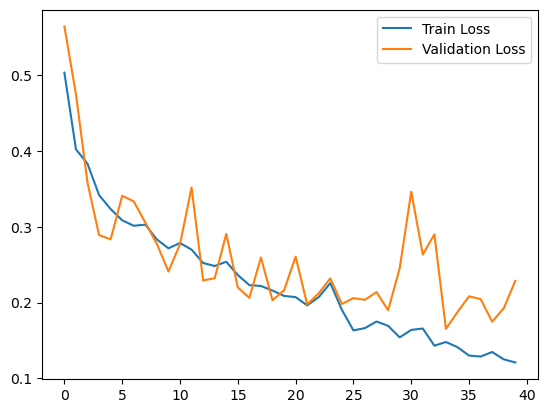

In [18]:
plt.plot(train_running_loss_history, label = 'Train Loss')
plt.plot(validation_running_loss_history, label = 'Validation Loss')
plt.legend()

In [19]:
model.eval()

UNet(
  (inc): inconv(
    (conv): double_conv(
      (conv): Sequential(
        (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
  (down1): down(
    (mpconv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): double_conv(
        (conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2

In [20]:
def avg_dice_index(dataloader):
    dice = 0.0
    model.eval()
    model.to(device)
    with torch.no_grad():
        for ith_batch, sample_batched in enumerate(dataloader):
            X_train = sample_batched['image'].to(device)
            y_train = sample_batched['mask'].to(device)
            y_predict = (model(X_train) + 0.5).int().float()
            dice += dice_index(y_predict, y_train)
    avg_dice = dice / len(dataloader)
    return avg_dice.item()

In [21]:
avg_dice_index(validation_loader)

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_55022619_QUAD2_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_55022619_QUAD2_R_m.jpgMissing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_36082218_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_36082218_QUAD3_R_m.jpg

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/54020819_BICEPS1_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/54020819_BICEPS1_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_56032919_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_56032919_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/38082318_BICEPS2_R.jpg, Mask: /Users/taliacho/Downloads/R

0.7723736763000488

In [22]:
avg_dice_index(train_loader)

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/49101618_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/49101618_QUAD3_R_m.jpgMissing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_56032919_BICEP3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_56032919_BICEP3_R_m.jpg

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_44091318_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_44091318_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_24061118_BICEP4_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_24061118_BICEP4_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/clinical_data/abs_bw/c_24061118_QUAD2_R.jpg, Mask: /Users/taliacho/Downloads/R

0.8794719576835632

In [23]:
avg_dice_index(test_loader)

Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_55022619_AB3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_55022619_AB3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_63053019_BICEP1_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_63053019_BICEP1_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_39082418_BICEP2_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_39082418_BICEP2_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_43091218_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_43091218_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_6121817_QUAD1_R.jpg, Mask: /

RecursionError: Caught RecursionError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)
           ^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/Unet/muscle_split.py", line 119, in __getitem__
    return self.__getitem__((index + 1) % len(self.data))
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/Unet/muscle_split.py", line 119, in __getitem__
    return self.__getitem__((index + 1) % len(self.data))
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/Unet/muscle_split.py", line 119, in __getitem__
    return self.__getitem__((index + 1) % len(self.data))
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  [Previous line repeated 978 more times]
  File "/Users/taliacho/Downloads/Ranger/Bryan-Ranger/Unet/muscle_split.py", line 99, in __getitem__
    image_name = self.data.iloc[index, 1]
                 ~~~~~~~~~~~~~~^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/indexing.py", line 1146, in __getitem__
    return self.obj._get_value(*key, takeable=self._takeable)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/frame.py", line 4002, in _get_value
    series = self._ixs(col, axis=1)
             ^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/frame.py", line 3804, in _ixs
    result = self._box_col_values(col_mgr, i)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/frame.py", line 4392, in _box_col_values
    obj = self._constructor_sliced_from_mgr(values, axes=values.axes)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/frame.py", line 656, in _constructor_sliced_from_mgr
    ser = self._sliced_from_mgr(mgr, axes)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/frame.py", line 652, in _sliced_from_mgr
    return Series._from_mgr(mgr, axes)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/generic.py", line 352, in _from_mgr
    NDFrame.__init__(obj, mgr)
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/generic.py", line 279, in __init__
    object.__setattr__(self, "_flags", Flags(self, allows_duplicate_labels=True))
                                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/taliacho/anaconda3/lib/python3.11/site-packages/pandas/core/flags.py", line 55, in __init__
    self._obj = weakref.ref(obj)
                ^^^^^^^^^^^^^^^^
RecursionError: maximum recursion depth exceeded while calling a Python object


e(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_45092718_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_45092718_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_4082318_BICEP2_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_4082318_BICEP2_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_32072318_AB1_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_32072318_AB1_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_57032919_QUAD3_R.jpg, Mask: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/c_57032919_QUAD3_R_m.jpg
Missing file(s). Image: /Users/taliacho/Downloads/Ranger/Bryan-Ranger/local_data/bw_infant_ar/54020819_QUAD2_R.jpg, Mask: /Users/taliacho/D

In [26]:
local_file_path = 'Learn_Unet_ccc.pt'

torch.save(model, local_file_path)

model = torch.load(local_file_path)

# Check if MPS is available and set the device
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")

# Move the model to the appropriate device
model.to(device)
model.eval()

UNet(
  (inc): inconv(
    (conv): double_conv(
      (conv): Sequential(
        (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
  (down1): down(
    (mpconv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): double_conv(
        (conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2